In [ ]:
import numpy as np
import pandas as pd
from textblob import TextBlob
from wordcloud import WordCloud

In [ ]:
import pandas as pd
import csv

def robust_csv_read(filepath, verbose=True):
    """
    Attempts to read a CSV file with various parsing options and provides diagnostic information.

    Args:
        filepath: Path to the CSV file
        verbose: If True, prints diagnostic information

    Returns:
        pandas DataFrame or None if all attempts fail
    """
    # Common delimiters to try
    delimiters = [',', ';', '\t', '|']

    # Different quoting options
    quote_options = [
        {'quoting': csv.QUOTE_MINIMAL},
        {'quoting': csv.QUOTE_ALL},
        {'quoting': csv.QUOTE_NONNUMERIC},
        {'quoting': csv.QUOTE_NONE, 'escapechar': '\\'}
    ]

    def peek_file(filepath, n_lines=5):
        """Preview first n lines of the file"""
        try:
            with open(filepath, 'r', encoding='utf-8') as f:
                preview = [next(f) for _ in range(n_lines)]
            return preview
        except Exception as e:
            return [f"Error reading file: {str(e)}"]

    if verbose:
        print("File preview (first 5 lines):")
        for i, line in enumerate(peek_file(filepath)):
            print(f"Line {i + 1}: {line.strip()}")

    # Try different combinations of parsing options
    for delimiter in delimiters:
        for quote_opts in quote_options:
            try:
                # Attempt to read with current settings
                df = pd.read_csv(
                    filepath,
                    delimiter=delimiter,
                    **quote_opts,
                    encoding='utf-8',
                    on_bad_lines='skip',  # Skip problematic rows
                    low_memory=False
                )

                if verbose:
                    print("\nSuccessful read with settings:")
                    print(f"Delimiter: '{delimiter}'")
                    print(f"Quote options: {quote_opts}")
                    print(f"\nDataFrame Info:")
                    print(f"Shape: {df.shape}")
                    print("\nColumns:")
                    for col in df.columns:
                        print(f"- {col}")

                return df

            except Exception as e:
                if verbose:
                    print(f"\nAttempt failed with delimiter '{delimiter}' and quote options {quote_opts}")
                    print(f"Error: {str(e)}")
                continue

    print("\nAll parsing attempts failed. Try these troubleshooting steps:")
    print("1. Check if the file is corrupted")
    print("2. Verify the file encoding")
    print("3. Examine problematic rows around line 41589")
    print("4. Consider pre-processing the file to fix formatting issues")
    return None

# Usage example
try:
    df = robust_csv_read('/kaggle/input/youtube/UScomments.csv')
    if df is not None:
        print("\nSuccessfully loaded the dataset!")
    else:
        print("\nFailed to load the dataset. Please check the troubleshooting suggestions above.")
except Exception as e:
    print(f"An unexpected error occurred: {str(e)}")

File preview (first 5 lines):
Line 1: video_id,comment_text,likes,replies
Line 2: XpVt6Z1Gjjo,"Logan Paul it's yo big day ‼️‼️‼️",4,0
Line 3: XpVt6Z1Gjjo,"I've been following you from the start of your vine channel and have seen all 365 vlogs",3,0
Line 4: XpVt6Z1Gjjo,"Say hi to Kong and maverick for me",3,0
Line 5: XpVt6Z1Gjjo,"MY FAN . attendance",3,0

Successful read with settings:
Delimiter: ','
Quote options: {'quoting': 0}

DataFrame Info:
Shape: (691400, 4)

Columns:
- video_id
- comment_text
- likes
- replies

Successfully loaded the dataset!


In [ ]:
df.head()

In [ ]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 691400 entries, 0 to 691399
Data columns (total 4 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   video_id      691400 non-null  object
 1   comment_text  691374 non-null  object
 2   likes         691400 non-null  object
 3   replies       691400 non-null  object
dtypes: object(4)
memory usage: 21.1+ MB
None


In [ ]:
import pandas as pd
import re
import sys

def remove_emojis(df, columns=None, verbose=True):
    """
    Remove emojis from specified text columns in a DataFrame.

    Args:
        df: pandas DataFrame
        columns: list of column names to clean. If None, cleans all object/string columns
        verbose: If True, prints cleaning statistics

    Returns:
        DataFrame with emojis removed from specified columns
    """
    # Regex pattern for matching emojis and other special characters
    emoji_pattern = re.compile(
        "["
        "\U0001F1E0-\U0001F1FF"  # flags (iOS)
        "\U0001F300-\U0001F5FF"  # symbols & pictographs
        "\U0001F600-\U0001F64F"  # emoticons
        "\U0001F680-\U0001F6FF"  # transport & map symbols
        "\U0001F700-\U0001F77F"  # alchemical symbols
        "\U0001F780-\U0001F7FF"  # Geometric Shapes Extended
        "\U0001F800-\U0001F8FF"  # Supplemental Arrows-C
        "\U0001F900-\U0001F9FF"  # Supplemental Symbols and Pictographs
        "\U0001FA00-\U0001FA6F"  # Chess Symbols
        "\U0001FA70-\U0001FAFF"  # Symbols and Pictographs Extended-A
        "\U00002702-\U000027B0"  # Dingbats
        "\U000024C2-\U0001F251"
        "]+",
        flags=re.UNICODE
    )

    # Create a copy of the DataFrame to avoid modifying the original
    df_clean = df.copy()

    # If no columns specified, detect text columns
    if columns is None:
        columns = df.select_dtypes(include=['object']).columns

    # Statistics dictionary
    stats = {col: {'original_unique': 0, 'cleaned_unique': 0, 'emoji_count': 0} for col in columns}

    # Process each column
    for col in columns:
        if col not in df.columns:
            print(f"Warning: Column '{col}' not found in DataFrame")
            continue

        if df[col].dtype != 'object':
            print(f"Warning: Column '{col}' is not a text column (dtype: {df[col].dtype})")
            continue

        # Store original unique count
        stats[col]['original_unique'] = df[col].nunique()

        # Count emojis before removal
        emoji_counts = df[col].str.count(emoji_pattern).sum()
        stats[col]['emoji_count'] = emoji_counts

        # Remove emojis
        df_clean[col] = df[col].astype(str).apply(lambda x: emoji_pattern.sub(r'', x))

        # Store cleaned unique count
        stats[col]['cleaned_unique'] = df_clean[col].nunique()

    if verbose:
        print("\nEmoji Cleaning Statistics:")
        print("-" * 50)
        for col, col_stats in stats.items():
            print(f"\nColumn: {col}")
            print(f"Total emojis removed: {col_stats['emoji_count']}")
            print(f"Unique values before cleaning: {col_stats['original_unique']}")
            print(f"Unique values after cleaning: {col_stats['cleaned_unique']}")

            # Sample before/after if emojis were found
            if col_stats['emoji_count'] > 0:
                sample_idx = df[col].str.count(emoji_pattern).idxmax()
                print("\nSample cleaning (row with most emojis):")
                print(f"Before: {df.loc[sample_idx, col]}")
                print(f"After:  {df_clean.loc[sample_idx, col]}")

    return df_clean

try:
    # Clean specific columns
    text_columns = ['comment_text']  # Replace with your column names
    df_cleaned = remove_emojis(df, columns=text_columns)

    # Or clean all text columns automatically
    # df_cleaned = remove_emojis(df)

except Exception as e:
    print(f"An error occurred: {str(e)}")


Emoji Cleaning Statistics:
--------------------------------------------------

Column: comment_text
Total emojis removed: 121575.0
Unique values before cleaning: 434075
Unique values after cleaning: 428802

Sample cleaning (row with most emojis):
Before: Here comes a snake:\n\n.________(__)\n________ \/\n.________/\n_____(▓. ( ▓\n____(▓▓. | ▓)\n__(▓▓▓▓ ▓▓)\n(▓(0)▓▓▓▓▓)\n_(▓▓ ▓▓▓▓▓))\n__(▓▓▓▓▓▓)\n__((▓▓▓▓▓))\n___(▓▓▓▓)\n__((▓▓▓▓)\n__(▓▓▓▓)\n_(▓▓▓▓)\n.(▓▓▓▓)\n(▓▓▓▓)\n(▓▓▓▓)\n.(▓▓▓▓)\n_(▓▓▓▓)\n__(▓▓▓▓)\n___(▓▓▓▓)\n____(▓▓▓▓)\n_____(▓▓▓▓)\n______(▓▓▓▓)\n_______(▓▓▓▓)\n________(▓▓▓▓)\n_________(▓▓▓▓)\n__________(▓▓▓▓)\n___________(▓▓▓▓)\n____________(▓▓▓▓)\n_____________(▓▓▓▓)\n______________(▓▓▓▓)\n_______________(▓▓▓▓)\n________________(▓▓▓▓)\n_________________(▓▓▓▓)\n_________________.(▓▓▓▓)\n__________________(▓▓▓▓)\n__________________(▓▓▓▓)\n__________________(▓▓▓▓)\n_________________.(▓▓▓▓)\n_________________(▓▓▓▓)\n________________(▓▓▓▓)\n_______________(▓▓▓▓)\n______________(▓▓▓▓)\

In [ ]:
df_cleaned.head()

,video_id,comment_text,likes,replies
0,XpVt6Z1Gjjo,Logan Paul it's yo big day ‼‼‼,4,0
1,XpVt6Z1Gjjo,I've been following you from the start of your...,3,0
2,XpVt6Z1Gjjo,Say hi to Kong and maverick for me,3,0
3,XpVt6Z1Gjjo,MY FAN . attendance,3,0
4,XpVt6Z1Gjjo,trending,3,0


In [ ]:
df_cleaned.shape

(691400, 4)

In [ ]:
import re
def clean_text(text):
    text = text.lower().strip()
    text = re.sub(r"([-?.!,/\"])", '', text)
    text = re.sub(r"[-()\"#/@;:<>{}`+=~|.!?,']", "", text)
    text = re.sub(r"[ ]+", " ", text)
    text = re.sub('\n\n','', text)
    text = text.rstrip().strip()
    return text

In [ ]:
clean_comments = []
for i in range(len(df_cleaned['comment_text'])):
    try:
        clean_comments.append(clean_text(df_cleaned['comment_text'][i]))
    except:
        clean_comments.append('None')
    if i % 1000==0:
        print(f'{i} iteration(s) completed')
df_cleaned['Clean Comments'] = clean_comments

0 iteration(s) completed
1000 iteration(s) completed
2000 iteration(s) completed
3000 iteration(s) completed
4000 iteration(s) completed
5000 iteration(s) completed
6000 iteration(s) completed
7000 iteration(s) completed
8000 iteration(s) completed
9000 iteration(s) completed
10000 iteration(s) completed
11000 iteration(s) completed
12000 iteration(s) completed
13000 iteration(s) completed
14000 iteration(s) completed
15000 iteration(s) completed
16000 iteration(s) completed
17000 iteration(s) completed
18000 iteration(s) completed
19000 iteration(s) completed
20000 iteration(s) completed
21000 iteration(s) completed
22000 iteration(s) completed
23000 iteration(s) completed
24000 iteration(s) completed
25000 iteration(s) completed
26000 iteration(s) completed
27000 iteration(s) completed
28000 iteration(s) completed
29000 iteration(s) completed
30000 iteration(s) completed
31000 iteration(s) completed
32000 iteration(s) completed
33000 iteration(s) completed
34000 iteration(s) complete

In [ ]:
df_cleaned['Clean Comments'][600]

'my two biggest disappointments from this event are 1 the iphone 10 not having a full 2k display and the screen only putting out 625nits of max brightness thats a little less than half the max brightness of the galaxy note 8 i understand it will \xa0be better than the note 8 in lots of other ways but i wanted it to match or be better in every conceivable way so the android fans wouldnt have anything to hold on to'

In [ ]:
from tqdm.notebook import tqdm
'''
Polarity is a float value within the range [-1.0 to 1.0].

Here, 0 indicates neutral,

+1 indicates a very positive sentiment, and

-1 represents a very negative sentiment.'''

polarity = []
for i in tqdm(df_cleaned['Clean Comments']):
    blob = TextBlob(i)
    polarity.append(round(blob.sentiment.polarity,3))
df_cleaned['polarity'] = polarity
print('Polarity Column added to the dataframe')

  0%|          | 0/691400 [00:00<?, ?it/s]

Polarity Column added to the dataframe


In [ ]:
df_cleaned.head()

,video_id,comment_text,likes,replies,Clean Comments,polarity
0,XpVt6Z1Gjjo,Logan Paul it's yo big day ‼‼‼,4,0,logan paul its yo big day ‼‼‼,0.0
1,XpVt6Z1Gjjo,I've been following you from the start of your...,3,0,ive been following you from the start of your ...,0.0
2,XpVt6Z1Gjjo,Say hi to Kong and maverick for me,3,0,say hi to kong and maverick for me,0.0
3,XpVt6Z1Gjjo,MY FAN . attendance,3,0,my fan attendance,0.0
4,XpVt6Z1Gjjo,trending,3,0,trending,0.0


In [ ]:
print('Reviews with Positive Sentiment based on Polarity :', len(df_cleaned[df_cleaned['polarity'] > 0]))
print('Reviews with Negative Sentiment based on Polarity :', len(df_cleaned[df_cleaned['polarity'] < 0]))
print('Reviews with Neutral Sentiment based on Polarity :', len(df_cleaned[df_cleaned['polarity'] == 0]))

Reviews with Positive Sentiment based on Polarity : 295780
Reviews with Negative Sentiment based on Polarity : 106571
Reviews with Neutral Sentiment based on Polarity : 289049


In [ ]:
sentiment = []
for i in range(len(df_cleaned['polarity'])):
    if df_cleaned['polarity'][i] > 0:
        sentiment.append('Positive')
    elif df_cleaned['polarity'][i] < 0:
        sentiment.append('Negative')
    else:
        sentiment.append('Neutral')
df_cleaned['sentiment'] = sentiment
print('Sentiment column has been added to the dataframe.')

Sentiment column has been added to the dataframe.


In [ ]:
df_cleaned.head()

,video_id,comment_text,likes,replies,Clean Comments,polarity,sentiment
0,XpVt6Z1Gjjo,Logan Paul it's yo big day ‼‼‼,4,0,logan paul its yo big day ‼‼‼,0.0,Neutral
1,XpVt6Z1Gjjo,I've been following you from the start of your...,3,0,ive been following you from the start of your ...,0.0,Neutral
2,XpVt6Z1Gjjo,Say hi to Kong and maverick for me,3,0,say hi to kong and maverick for me,0.0,Neutral
3,XpVt6Z1Gjjo,MY FAN . attendance,3,0,my fan attendance,0.0,Neutral
4,XpVt6Z1Gjjo,trending,3,0,trending,0.0,Neutral


In [ ]:
df_cleaned['Clean Comments'][1]

'ive been following you from the start of your vine channel and have seen all 365 vlogs'

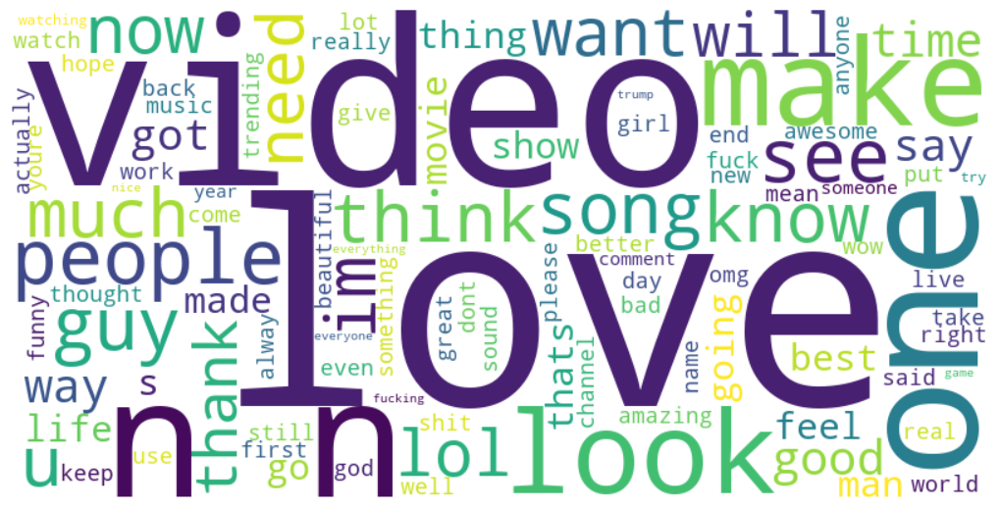

In [ ]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import numpy as np

def generate_youtube_wordcloud(text_data):
    text = ' '.join(text_data)

    wordcloud = WordCloud(
        width=800,
        height=400,
        background_color='white',
        max_words=100,
        min_font_size=10,
        random_state=42
    ).generate(text)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.tight_layout(pad=0)

    return plt



plt = generate_youtube_wordcloud(df_cleaned['Clean Comments'])
plt.show()

In [ ]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px


# Calculate sentiment counts
sentiment_counts = df_cleaned['sentiment'].value_counts().reset_index()
sentiment_counts.columns = ['Sentiment', 'Count']

# Create the figure with subplots
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=('Sentiment Distribution (Bar)', 'Sentiment Distribution (Pie)'),
    specs=[[{"type": "bar"}, {"type": "pie"}]]
)

# Add bar chart
fig.add_trace(
    go.Bar(
        x=sentiment_counts['Sentiment'],
        y=sentiment_counts['Count'],
        text=sentiment_counts['Count'],
        textposition='auto',
        marker_color=['#3b82f6', '#22c55e', '#ef4444'],
        name='Count'
    ),
    row=1, col=1
)

# Add pie chart
fig.add_trace(
    go.Pie(
        labels=sentiment_counts['Sentiment'],
        values=sentiment_counts['Count'],
        hole=0.4,
        marker_colors=['#3b82f6', '#22c55e', '#ef4444']
    ),
    row=1, col=2
)

# Update layout
fig.update_layout(
    title_text="YouTube Comments Sentiment Analysis",
    title_x=0.5,
    title_font_size=24,
    showlegend=False,
    width=1200,
    height=500,
    template='plotly_white',
    annotations=[
        dict(
            text=f"Total Comments: {len(df)}",
            xref="paper",
            yref="paper",
            x=0.5,
            y=-0.15,
            showarrow=False,
            font_size=14
        )
    ]
)

# Update axes
fig.update_xaxes(title_text="Sentiment", row=1, col=1)
fig.update_yaxes(title_text="Number of Comments", row=1, col=1)

# Show the figure
fig.show()



In [ ]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy import stats


# Generate KDE
kernel = stats.gaussian_kde(df_cleaned['polarity'])
x_range = np.linspace(min(df_cleaned['polarity'])-0.5, max(df_cleaned['polarity'])+0.5, 200)
kde = kernel(x_range)

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add KDE plot
fig.add_trace(
    go.Scatter(
        x=x_range,
        y=kde,
        name="Density",
        fill='tozeroy',
        line=dict(color='#3b82f6', width=2)
    ),
    secondary_y=False
)

# Add histogram
fig.add_trace(
    go.Histogram(
        x=df_cleaned['polarity'],
        name="Histogram",
        opacity=0.7,
        nbinsx=20,
        marker_color='#93c5fd'
    ),
    secondary_y=True
)

# Update layout
fig.update_layout(
    title={
        'text': "Sentiment Polarity Distribution with KDE",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': dict(size=24)
    },
    template='plotly_white',
    width=1000,
    height=600,
    hovermode='x unified',
    showlegend=True,
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01
    ),
    annotations=[
        dict(
            text=f"Total Comments: {len(df_cleaned)}<br>Mean Polarity: {df_cleaned['polarity'].mean():.3f}<br>Std Dev: {df_cleaned['polarity'].std():.3f}",
            xref="paper",
            yref="paper",
            x=0.99,
            y=0.99,
            showarrow=False,
            align='right',
            bgcolor='rgba(255, 255, 255, 0.8)',
            bordercolor='rgba(0, 0, 0, 0.3)',
            borderwidth=1,
            borderpad=4,
            font=dict(size=12)
        )
    ]
)

# Update axes
fig.update_xaxes(
    title_text="Polarity Score",
    gridcolor='rgba(0, 0, 0, 0.1)',
    zeroline=True,
    zerolinecolor='rgba(0, 0, 0, 0.2)'
)
fig.update_yaxes(
    title_text="Density",
    secondary_y=False,
    gridcolor='rgba(0, 0, 0, 0.1)'
)
fig.update_yaxes(
    title_text="Count",
    secondary_y=True,
    gridcolor='rgba(0, 0, 0, 0.1)'
)

# Show plot
fig.show()



In [ ]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px



# Create sentiment count and percentage
sentiment_counts = df_cleaned['sentiment'].value_counts().reset_index()
sentiment_counts.columns = ['Sentiment', 'Count']
sentiment_counts['Percentage'] = (sentiment_counts['Count'] / len(df_cleaned) * 100).round(2)

# Create figure with subplots
fig = make_subplots(
    rows=2, cols=2,
    specs=[[{"type": "violin"}, {"type": "pie"}],
           [{"type": "bar", "colspan": 2}, None]],
    subplot_titles=('Sentiment Distribution (Violin)', 'Sentiment Distribution (Pie)',
                   'Sentiment Counts with Percentages'),
    vertical_spacing=0.15,
    horizontal_spacing=0.1
)

# Add violin plot
fig.add_trace(
    go.Violin(
        y=df_cleaned['sentiment'],
        box_visible=True,
        line_color='#3b82f6',
        fillcolor='#93c5fd',
        opacity=0.6,
        name='Sentiment Distribution'
    ),
    row=1, col=1
)

# Add pie chart
fig.add_trace(
    go.Pie(
        labels=sentiment_counts['Sentiment'],
        values=sentiment_counts['Count'],
        hole=0.4,
        marker_colors=['#3b82f6', '#22c55e', '#ef4444'],
        textinfo='label+percent',
        name='Sentiment Ratio'
    ),
    row=1, col=2
)

# Add bar chart with text annotations
fig.add_trace(
    go.Bar(
        x=sentiment_counts['Sentiment'],
        y=sentiment_counts['Count'],
        text=[f'Count: {count}<br>({pct}%)' for count, pct in
              zip(sentiment_counts['Count'], sentiment_counts['Percentage'])],
        textposition='auto',
        marker_color=['#3b82f6', '#22c55e', '#ef4444'],
        name='Sentiment Counts'
    ),
    row=2, col=1
)

# Update layout
fig.update_layout(
    title={
        'text': "Comprehensive Sentiment Analysis",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': dict(size=24)
    },
    template='plotly_white',
    width=1200,
    height=800,
    showlegend=False,
    annotations=[
        dict(
            text=f"Total Comments Analyzed: {len(df)}",
            xref="paper",
            yref="paper",
            x=0.5,
            y=-0.15,
            showarrow=False,
            font_size=14
        )
    ]
)

# Update axes
fig.update_xaxes(title_text="Sentiment Categories", row=2, col=1)
fig.update_yaxes(title_text="Count", row=2, col=1)
fig.update_yaxes(title_text="Sentiment Categories", row=1, col=1)

# Show plot
fig.show()

# Optional: Save the figure
# fig.write_html("sentiment_analysis_comprehensive.html")

# Print statistical summary
print("\nStatistical Summary:")
print("-------------------")
print(sentiment_counts.to_string(index=False))
print("\nMost common sentiment:", df_cleaned['sentiment'].mode()[0])
print("Number of unique sentiments:", df_cleaned['sentiment'].nunique())
print("Total comments:", len(df_cleaned))


Statistical Summary:
-------------------
Sentiment  Count  Percentage
 Positive 295780       42.78
  Neutral 289049       41.81
 Negative 106571       15.41

Most common sentiment: Positive
Number of unique sentiments: 3
Total comments: 691400


In [ ]:
df_cleaned.to_csv('sentyt.csv', index = False)

In [ ]:
df_cleaned['sentiment'].value_counts()

sentiment
Positive    295780
Neutral     289049
Negative    106571
Name: count, dtype: int64

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import numpy as np
import pandas as pd
from collections import Counter
import os
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns

# Define the Vocabulary class
class Vocabulary:
    def __init__(self, min_freq=1):
        self.itos = {0: "<PAD>", 1: "<UNK>"}
        self.stoi = {"<PAD>": 0, "<UNK>": 1}
        self.min_freq = min_freq

    def build_vocabulary(self, texts):
        frequencies = Counter()
        for text in texts:
            if isinstance(text, str):
                frequencies.update(text.split())
        idx = 2
        for word, freq in frequencies.items():
            if freq >= self.min_freq:
                self.stoi[word] = idx
                self.itos[idx] = word
                idx += 1

    def numericalize(self, text):
        if not isinstance(text, str):
            return [self.stoi["<UNK>"]] * 5
        return [self.stoi.get(word, self.stoi["<UNK>"]) for word in text.split()]

# Define Dataset and Model classes
class CommentDataset(Dataset):
    def __init__(self, comments, sentiments, vocab, max_length=100):
        self.comments = comments
        self.sentiments = sentiments
        self.vocab = vocab
        self.max_length = max_length

    def __len__(self):
        return len(self.comments)

    def __getitem__(self, idx):
        comment = self.comments[idx]
        sentiment = self.sentiments[idx]
        numericalized_comment = self.vocab.numericalize(comment)
        if len(numericalized_comment) < self.max_length:
            numericalized_comment.extend([0] * (self.max_length - len(numericalized_comment)))
        else:
            numericalized_comment = numericalized_comment[:self.max_length]
        return torch.tensor(numericalized_comment, dtype=torch.long), torch.tensor(sentiment, dtype=torch.long)

class SentimentLSTM(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, output_dim, n_layers, dropout, bidirectional=True):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, embedding_dim, padding_idx=0)
        self.rnn = nn.LSTM(
            embedding_dim,
            hidden_dim,
            n_layers,
            dropout=dropout if n_layers > 1 else 0,
            batch_first=True,
            bidirectional=bidirectional
        )
        self.fc = nn.Linear(hidden_dim * 2 if bidirectional else hidden_dim, output_dim)
        self.dropout = nn.Dropout(dropout)

    def forward(self, text):
        embedded = self.dropout(self.embedding(text))
        output, (hidden, cell) = self.rnn(embedded)
        if self.rnn.bidirectional:
            hidden = torch.cat((hidden[-2, :, :], hidden[-1, :, :]), dim=1)
        else:
            hidden = hidden[-1, :, :]
        return self.fc(self.dropout(hidden))

class EarlyStopping:
    def __init__(self, patience=5, min_delta=0, restore_best_weights=True):
        self.patience = patience
        self.min_delta = min_delta
        self.restore_best_weights = restore_best_weights
        self.best_model = None
        self.best_loss = None
        self.counter = 0

    def __call__(self, val_loss, model):
        if self.best_loss is None:
            self.best_loss = val_loss
            self.best_model = model.state_dict().copy()
        elif val_loss > self.best_loss - self.min_delta:
            self.counter += 1
            if self.counter >= self.patience:
                if self.restore_best_weights:
                    model.load_state_dict(self.best_model)
                return True
        else:
            self.best_loss = val_loss
            self.best_model = model.state_dict().copy()
            self.counter = 0
        return False

def train_model(model, train_loader, criterion, optimizer, device, scheduler=None):
    model.train()
    epoch_loss = 0
    epoch_acc = 0
    for batch_idx, (comments, labels) in enumerate(tqdm(train_loader, desc='Training', leave=False)):
        comments, labels = comments.to(device), labels.to(device)
        optimizer.zero_grad()
        predictions = model(comments)
        loss = criterion(predictions, labels)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        if scheduler is not None:
            scheduler.step()
        epoch_loss += loss.item()
        epoch_acc += (predictions.argmax(1) == labels).sum().item()
    return epoch_loss / len(train_loader), epoch_acc / len(train_loader.dataset)
def evaluate_model(model, test_loader, criterion, device):
    model.eval()
    epoch_loss = 0
    epoch_acc = 0

    # Progress bar for evaluation batches
    pbar = tqdm(test_loader, desc='Evaluating', leave=False)

    with torch.no_grad():
        for comments, labels in pbar:
            comments, labels = comments.to(device), labels.to(device)

            predictions = model(comments)
            loss = criterion(predictions, labels)

            epoch_loss += loss.item()
            epoch_acc += (predictions.argmax(1) == labels).sum().item()

            # Update progress bar
            pbar.set_postfix({'batch_loss': f'{loss.item():.3f}'})

    return epoch_loss / len(test_loader), epoch_acc / len(test_loader.dataset)




# Main training function
def train_sentiment_classifier(df, device='cuda' if torch.cuda.is_available() else 'cpu'):
    print(f"Using device: {device}")
    le = LabelEncoder()
    sentiments = le.fit_transform(df['sentiment'])
    vocab = Vocabulary(min_freq=2)
    vocab.build_vocabulary(df['Clean Comments'])
    print(f"Vocabulary size: {len(vocab.itos)}")

    X_train, X_test, y_train, y_test = train_test_split(
        df['Clean Comments'], sentiments, test_size=0.2, random_state=42, stratify=sentiments
    )

    train_dataset = CommentDataset(X_train.values, y_train, vocab)
    test_dataset = CommentDataset(X_test.values, y_test, vocab)
    train_loader = DataLoader(train_dataset, batch_size=1000, shuffle=True, num_workers=4)
    test_loader = DataLoader(test_dataset, batch_size=1000, num_workers=4)

    model = SentimentRNN(
        vocab_size=len(vocab.itos),
        embedding_dim=300,
        hidden_dim=256,
        output_dim=len(le.classes_),
        n_layers=2,
        dropout=0.5,
        bidirectional=True
    ).to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.AdamW(model.parameters(), lr=2e-4, weight_decay=0.01)
    scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=2e-4, epochs=50, steps_per_epoch=len(train_loader))
    early_stopping = EarlyStopping(patience=5)

    train_losses, test_losses = [], []
    train_accs, test_accs = [], []

    for epoch in range(50):
        print(f"\nEpoch {epoch+1}/50")
        train_loss, train_acc = train_model(model, train_loader, criterion, optimizer, device, scheduler)
        test_loss, test_acc = evaluate_model(model, test_loader, criterion, device)
        train_losses.append(train_loss)
        test_losses.append(test_loss)
        train_accs.append(train_acc)
        test_accs.append(test_acc)
        print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc*100:.2f}%")
        print(f"Test Loss: {test_loss:.4f} | Test Acc: {test_acc*100:.2f}%")
        if early_stopping(test_loss, model):
            print("EarlyStopping triggered")
            break
    return model, vocab, le, train_losses, test_losses, train_accs, test_accs

# Load your DataFrame here
model, vocab, label_encoder, train_losses, test_losses, train_accs, test_accs = train_sentiment_classifier(df_cleaned)


Using device: cuda
Vocabulary size: 117031

Epoch 1/50


Train Loss: 1.0340 | Train Acc: 48.89%
Test Loss: 0.9681 | Test Acc: 56.73%

Epoch 2/50


Train Loss: 0.8578 | Train Acc: 62.28%
Test Loss: 0.7196 | Test Acc: 69.89%

Epoch 3/50


Train Loss: 0.7087 | Train Acc: 70.02%
Test Loss: 0.5980 | Test Acc: 75.63%

Epoch 4/50


Train Loss: 0.6019 | Train Acc: 75.36%
Test Loss: 0.5342 | Test Acc: 79.30%

Epoch 5/50


Train Loss: 0.5336 | Train Acc: 78.87%
Test Loss: 0.4961 | Test Acc: 82.19%

Epoch 6/50


Train Loss: 0.4602 | Train Acc: 82.55%
Test Loss: 0.3709 | Test Acc: 87.48%

Epoch 7/50


Train Loss: 0.3972 | Train Acc: 85.48%
Test Loss: 0.3395 | Test Acc: 89.09%

Epoch 8/50


Train Loss: 0.3496 | Train Acc: 87.54%
Test Loss: 0.3065 | Test Acc: 90.95%

Epoch 9/50


Train Loss: 0.3097 | Train Acc: 89.14%
Test Loss: 0.2781 | Test Acc: 92.08%

Epoch 10/50


Train Loss: 0.2768 | Train Acc: 90.45%
Test Loss: 0.2359 | Test Acc: 93.31%

Epoch 11/50


Train Loss: 0.2469 | Train Acc: 91.57%
Test Loss: 0.2306 | Test Acc: 93.84%

Epoch 12/50


Train Loss: 0.2221 | Train Acc: 92.54%
Test Loss: 0.1748 | Test Acc: 94.85%

Epoch 13/50


Train Loss: 0.1999 | Train Acc: 93.32%
Test Loss: 0.1603 | Test Acc: 95.45%

Epoch 14/50


Train Loss: 0.1805 | Train Acc: 94.03%
Test Loss: 0.1559 | Test Acc: 95.80%

Epoch 15/50


Train Loss: 0.1629 | Train Acc: 94.64%
Test Loss: 0.1302 | Test Acc: 96.36%

Epoch 16/50


Train Loss: 0.1491 | Train Acc: 95.11%
Test Loss: 0.1218 | Test Acc: 96.62%

Epoch 17/50


Train Loss: 0.1380 | Train Acc: 95.49%
Test Loss: 0.1081 | Test Acc: 96.91%

Epoch 18/50


Train Loss: 0.1273 | Train Acc: 95.86%
Test Loss: 0.1054 | Test Acc: 97.11%

Epoch 19/50


Train Loss: 0.1184 | Train Acc: 96.14%
Test Loss: 0.1007 | Test Acc: 97.26%

Epoch 20/50


Train Loss: 0.1102 | Train Acc: 96.45%
Test Loss: 0.0894 | Test Acc: 97.48%

Epoch 21/50


Train Loss: 0.1026 | Train Acc: 96.66%
Test Loss: 0.0867 | Test Acc: 97.58%

Epoch 22/50


Train Loss: 0.0976 | Train Acc: 96.85%
Test Loss: 0.0778 | Test Acc: 97.80%

Epoch 23/50


Train Loss: 0.0917 | Train Acc: 97.04%
Test Loss: 0.0798 | Test Acc: 97.78%

Epoch 24/50


Train Loss: 0.0872 | Train Acc: 97.18%
Test Loss: 0.0730 | Test Acc: 97.94%

Epoch 25/50


Train Loss: 0.0829 | Train Acc: 97.31%
Test Loss: 0.0702 | Test Acc: 98.07%

Epoch 26/50


Train Loss: 0.0786 | Train Acc: 97.44%
Test Loss: 0.0662 | Test Acc: 98.13%

Epoch 27/50


Train Loss: 0.0750 | Train Acc: 97.57%
Test Loss: 0.0638 | Test Acc: 98.22%

Epoch 28/50


Train Loss: 0.0721 | Train Acc: 97.65%
Test Loss: 0.0635 | Test Acc: 98.28%

Epoch 29/50


Train Loss: 0.0694 | Train Acc: 97.75%
Test Loss: 0.0653 | Test Acc: 98.23%

Epoch 30/50


Train Loss: 0.0659 | Train Acc: 97.87%
Test Loss: 0.0580 | Test Acc: 98.38%

Epoch 31/50


Train Loss: 0.0640 | Train Acc: 97.95%
Test Loss: 0.0607 | Test Acc: 98.35%

Epoch 32/50


Train Loss: 0.0617 | Train Acc: 98.00%
Test Loss: 0.0560 | Test Acc: 98.51%

Epoch 33/50


Train Loss: 0.0599 | Train Acc: 98.05%
Test Loss: 0.0570 | Test Acc: 98.50%

Epoch 34/50


Train Loss: 0.0582 | Train Acc: 98.11%
Test Loss: 0.0554 | Test Acc: 98.54%

Epoch 35/50


Train Loss: 0.0562 | Train Acc: 98.18%
Test Loss: 0.0534 | Test Acc: 98.57%

Epoch 36/50


Train Loss: 0.0552 | Train Acc: 98.20%
Test Loss: 0.0565 | Test Acc: 98.54%

Epoch 37/50


Train Loss: 0.0535 | Train Acc: 98.27%
Test Loss: 0.0533 | Test Acc: 98.63%

Epoch 38/50


Train Loss: 0.0522 | Train Acc: 98.31%
Test Loss: 0.0524 | Test Acc: 98.61%

Epoch 39/50


Train Loss: 0.0516 | Train Acc: 98.31%
Test Loss: 0.0507 | Test Acc: 98.65%

Epoch 40/50


Train Loss: 0.0509 | Train Acc: 98.35%
Test Loss: 0.0523 | Test Acc: 98.62%

Epoch 41/50


Train Loss: 0.0500 | Train Acc: 98.39%
Test Loss: 0.0519 | Test Acc: 98.67%

Epoch 42/50


Train Loss: 0.0490 | Train Acc: 98.40%
Test Loss: 0.0514 | Test Acc: 98.70%

Epoch 43/50


Train Loss: 0.0489 | Train Acc: 98.41%
Test Loss: 0.0517 | Test Acc: 98.66%

Epoch 44/50


Train Loss: 0.0479 | Train Acc: 98.44%
Test Loss: 0.0512 | Test Acc: 98.69%
EarlyStopping triggered


In [ ]:
class SentimentRNN(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, output_dim, n_layers, dropout, bidirectional=True):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, embedding_dim, padding_idx=0)
        self.rnn = nn.RNN(
            embedding_dim,
            hidden_dim,
            n_layers,
            dropout=dropout if n_layers > 1 else 0,
            batch_first=True,
            bidirectional=bidirectional
        )
        self.fc = nn.Linear(hidden_dim * 2 if bidirectional else hidden_dim, output_dim)
        self.dropout = nn.Dropout(dropout)

    def forward(self, text):
        embedded = self.dropout(self.embedding(text))
        output, hidden = self.rnn(embedded)  # RNN returns only hidden, no cell state
        if self.rnn.bidirectional:
            hidden = torch.cat((hidden[-2, :, :], hidden[-1, :, :]), dim=1)
        else:
            hidden = hidden[-1, :, :]
        return self.fc(self.dropout(hidden))

class EarlyStopping:
    def __init__(self, patience=5, min_delta=0, restore_best_weights=True):
        self.patience = patience
        self.min_delta = min_delta
        self.restore_best_weights = restore_best_weights
        self.best_model = None
        self.best_loss = None
        self.counter = 0

    def __call__(self, val_loss, model):
        if self.best_loss is None:
            self.best_loss = val_loss
            self.best_model = model.state_dict().copy()
        elif val_loss > self.best_loss - self.min_delta:
            self.counter += 1
            if self.counter >= self.patience:
                if self.restore_best_weights:
                    model.load_state_dict(self.best_model)
                return True
        else:
            self.best_loss = val_loss
            self.best_model = model.state_dict().copy()
            self.counter = 0
        return False

def train_model(model, train_loader, criterion, optimizer, device, scheduler=None):
    model.train()
    epoch_loss = 0
    epoch_acc = 0
    for batch_idx, (comments, labels) in enumerate(tqdm(train_loader, desc='Training', leave=False)):
        comments, labels = comments.to(device), labels.to(device)
        optimizer.zero_grad()
        predictions = model(comments)
        loss = criterion(predictions, labels)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        if scheduler is not None:
            scheduler.step()
        epoch_loss += loss.item()
        epoch_acc += (predictions.argmax(1) == labels).sum().item()
    return epoch_loss / len(train_loader), epoch_acc / len(train_loader.dataset)

def evaluate_model(model, test_loader, criterion, device):
    model.eval()
    epoch_loss = 0
    epoch_acc = 0

    pbar = tqdm(test_loader, desc='Evaluating', leave=False)

    with torch.no_grad():
        for comments, labels in pbar:
            comments, labels = comments.to(device), labels.to(device)

            predictions = model(comments)
            loss = criterion(predictions, labels)

            epoch_loss += loss.item()
            epoch_acc += (predictions.argmax(1) == labels).sum().item()

            pbar.set_postfix({'batch_loss': f'{loss.item():.3f}'})

    return epoch_loss / len(test_loader), epoch_acc / len(test_loader.dataset)

def train_sentiment_classifier(df, device='cuda' if torch.cuda.is_available() else 'cpu'):
    print(f"Using device: {device}")
    le = LabelEncoder()
    sentiments = le.fit_transform(df['sentiment'])
    vocab = Vocabulary(min_freq=2)
    vocab.build_vocabulary(df['Clean Comments'])
    print(f"Vocabulary size: {len(vocab.itos)}")

    X_train, X_test, y_train, y_test = train_test_split(
        df['Clean Comments'], sentiments, test_size=0.2, random_state=42, stratify=sentiments
    )

    train_dataset = CommentDataset(X_train.values, y_train, vocab)
    test_dataset = CommentDataset(X_test.values, y_test, vocab)
    train_loader = DataLoader(train_dataset, batch_size=1500, shuffle=True, num_workers=4)
    test_loader = DataLoader(test_dataset, batch_size=1500, num_workers=4)

    model = SentimentRNN(
        vocab_size=len(vocab.itos),
        embedding_dim=300,
        hidden_dim=256,
        output_dim=len(le.classes_),
        n_layers=2,
        dropout=0.5,
        bidirectional=True
    ).to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.AdamW(model.parameters(), lr=2e-4, weight_decay=0.01)
    scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=2e-4, epochs=50, steps_per_epoch=len(train_loader))
    early_stopping = EarlyStopping(patience=5)

    train_losses, test_losses = [], []
    train_accs, test_accs = [], []

    for epoch in range(50):
        print(f"\nEpoch {epoch+1}/50")
        train_loss, train_acc = train_model(model, train_loader, criterion, optimizer, device, scheduler)
        test_loss, test_acc = evaluate_model(model, test_loader, criterion, device)
        train_losses.append(train_loss)
        test_losses.append(test_loss)
        train_accs.append(train_acc)
        test_accs.append(test_acc)
        print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc*100:.2f}%")
        print(f"Test Loss: {test_loss:.4f} | Test Acc: {test_acc*100:.2f}%")
        if early_stopping(test_loss, model):
            print("EarlyStopping triggered")
            break
    return model, vocab, le, train_losses, test_losses, train_accs, test_accs
rnn_model, vocab, label_encoder, train_losses, test_losses, train_accs, test_accs = train_sentiment_classifier(df_cleaned)

Using device: cuda
Vocabulary size: 117031

Epoch 1/50


Train Loss: 1.0455 | Train Acc: 44.08%
Test Loss: 0.9767 | Test Acc: 51.97%

Epoch 2/50


Train Loss: 0.9668 | Train Acc: 52.88%
Test Loss: 0.9525 | Test Acc: 55.84%

Epoch 3/50


Train Loss: 0.8948 | Train Acc: 59.95%
Test Loss: 0.8992 | Test Acc: 59.92%

Epoch 4/50


Train Loss: 0.8490 | Train Acc: 62.98%
Test Loss: 0.8888 | Test Acc: 64.10%

Epoch 5/50


Train Loss: 0.7863 | Train Acc: 66.36%
Test Loss: 0.7895 | Test Acc: 67.78%

Epoch 6/50


Train Loss: 0.7461 | Train Acc: 68.38%
Test Loss: 0.7210 | Test Acc: 71.48%

Epoch 7/50


Train Loss: 0.6963 | Train Acc: 71.01%
Test Loss: 0.7820 | Test Acc: 71.81%

Epoch 8/50


Train Loss: 0.6290 | Train Acc: 74.38%
Test Loss: 0.7325 | Test Acc: 75.57%

Epoch 9/50


Train Loss: 0.5662 | Train Acc: 77.73%
Test Loss: 0.6433 | Test Acc: 80.19%

Epoch 10/50


Train Loss: 0.5125 | Train Acc: 80.47%
Test Loss: 0.7015 | Test Acc: 80.62%

Epoch 11/50


Train Loss: 0.4554 | Train Acc: 83.21%
Test Loss: 0.6487 | Test Acc: 83.67%

Epoch 12/50


Train Loss: 0.4056 | Train Acc: 85.57%
Test Loss: 0.4489 | Test Acc: 88.85%

Epoch 13/50


Train Loss: 0.3640 | Train Acc: 87.48%
Test Loss: 0.4154 | Test Acc: 90.09%

Epoch 14/50


Train Loss: 0.3274 | Train Acc: 88.99%
Test Loss: 0.3628 | Test Acc: 91.36%

Epoch 15/50


Train Loss: 0.2974 | Train Acc: 90.16%
Test Loss: 0.2676 | Test Acc: 93.17%

Epoch 16/50


Train Loss: 0.2695 | Train Acc: 91.25%
Test Loss: 0.2646 | Test Acc: 93.38%

Epoch 17/50


Train Loss: 0.2480 | Train Acc: 91.97%
Test Loss: 0.2203 | Test Acc: 94.39%

Epoch 18/50


Train Loss: 0.2299 | Train Acc: 92.61%
Test Loss: 0.2063 | Test Acc: 94.48%

Epoch 19/50


Train Loss: 0.2128 | Train Acc: 93.14%
Test Loss: 0.1921 | Test Acc: 95.16%

Epoch 20/50


Train Loss: 0.1988 | Train Acc: 93.65%
Test Loss: 0.1781 | Test Acc: 95.49%

Epoch 21/50


Train Loss: 0.1863 | Train Acc: 94.07%
Test Loss: 0.1709 | Test Acc: 95.77%

Epoch 22/50


Train Loss: 0.1765 | Train Acc: 94.39%
Test Loss: 0.1562 | Test Acc: 96.01%

Epoch 23/50


Train Loss: 0.1682 | Train Acc: 94.64%
Test Loss: 0.1438 | Test Acc: 96.23%

Epoch 24/50


Train Loss: 0.1602 | Train Acc: 94.94%
Test Loss: 0.1535 | Test Acc: 96.22%

Epoch 25/50


Train Loss: 0.1538 | Train Acc: 95.14%
Test Loss: 0.1391 | Test Acc: 96.51%

Epoch 26/50


Train Loss: 0.1466 | Train Acc: 95.36%
Test Loss: 0.1360 | Test Acc: 96.55%

Epoch 27/50


Train Loss: 0.1410 | Train Acc: 95.56%
Test Loss: 0.1482 | Test Acc: 96.54%

Epoch 28/50


Train Loss: 0.1367 | Train Acc: 95.76%
Test Loss: 0.1283 | Test Acc: 96.75%

Epoch 29/50


Train Loss: 0.1312 | Train Acc: 95.90%
Test Loss: 0.1307 | Test Acc: 96.66%

Epoch 30/50


Train Loss: 0.1277 | Train Acc: 96.01%
Test Loss: 0.1276 | Test Acc: 96.80%

Epoch 31/50


Train Loss: 0.1245 | Train Acc: 96.13%
Test Loss: 0.1301 | Test Acc: 96.73%

Epoch 32/50


Train Loss: 0.1209 | Train Acc: 96.23%
Test Loss: 0.1258 | Test Acc: 96.88%

Epoch 33/50


Train Loss: 0.1185 | Train Acc: 96.31%
Test Loss: 0.1236 | Test Acc: 96.86%

Epoch 34/50


Train Loss: 0.1151 | Train Acc: 96.40%
Test Loss: 0.1191 | Test Acc: 97.04%

Epoch 35/50


Train Loss: 0.1132 | Train Acc: 96.50%
Test Loss: 0.1225 | Test Acc: 97.00%

Epoch 36/50


Train Loss: 0.1110 | Train Acc: 96.55%
Test Loss: 0.1169 | Test Acc: 97.01%

Epoch 37/50


Train Loss: 0.1087 | Train Acc: 96.63%
Test Loss: 0.1238 | Test Acc: 96.92%

Epoch 38/50


Train Loss: 0.1069 | Train Acc: 96.69%
Test Loss: 0.1240 | Test Acc: 96.99%

Epoch 39/50


Train Loss: 0.1062 | Train Acc: 96.73%
Test Loss: 0.1168 | Test Acc: 97.04%

Epoch 40/50


Train Loss: 0.1041 | Train Acc: 96.77%
Test Loss: 0.1140 | Test Acc: 97.14%

Epoch 41/50


Train Loss: 0.1032 | Train Acc: 96.82%
Test Loss: 0.1178 | Test Acc: 97.09%

Epoch 42/50


Train Loss: 0.1010 | Train Acc: 96.90%
Test Loss: 0.1177 | Test Acc: 97.06%

Epoch 43/50


Train Loss: 0.1017 | Train Acc: 96.84%
Test Loss: 0.1184 | Test Acc: 96.99%

Epoch 44/50


Train Loss: 0.1008 | Train Acc: 96.88%
Test Loss: 0.1155 | Test Acc: 97.07%

Epoch 45/50


Train Loss: 0.0997 | Train Acc: 96.90%
Test Loss: 0.1152 | Test Acc: 97.13%
EarlyStopping triggered


In [ ]:
# Training GRU
class SentimentGRU(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, output_dim, n_layers, dropout, bidirectional=True):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, embedding_dim, padding_idx=0)
        self.gru = nn.GRU(
            embedding_dim,
            hidden_dim,
            n_layers,
            dropout=dropout if n_layers > 1 else 0,
            batch_first=True,
            bidirectional=bidirectional
        )
        self.fc = nn.Linear(hidden_dim * 2 if bidirectional else hidden_dim, output_dim)
        self.dropout = nn.Dropout(dropout)

    def forward(self, text):
        embedded = self.dropout(self.embedding(text))
        output, hidden = self.gru(embedded)  # GRU returns only hidden, no cell state
        if self.gru.bidirectional:
            hidden = torch.cat((hidden[-2, :, :], hidden[-1, :, :]), dim=1)
        else:
            hidden = hidden[-1, :, :]
        return self.fc(self.dropout(hidden))

class EarlyStopping:
    def __init__(self, patience=5, min_delta=0, restore_best_weights=True):
        self.patience = patience
        self.min_delta = min_delta
        self.restore_best_weights = restore_best_weights
        self.best_model = None
        self.best_loss = None
        self.counter = 0

    def __call__(self, val_loss, model):
        if self.best_loss is None:
            self.best_loss = val_loss
            self.best_model = model.state_dict().copy()
        elif val_loss > self.best_loss - self.min_delta:
            self.counter += 1
            if self.counter >= self.patience:
                if self.restore_best_weights:
                    model.load_state_dict(self.best_model)
                return True
        else:
            self.best_loss = val_loss
            self.best_model = model.state_dict().copy()
            self.counter = 0
        return False

def train_model(model, train_loader, criterion, optimizer, device, scheduler=None):
    model.train()
    epoch_loss = 0
    epoch_acc = 0
    for batch_idx, (comments, labels) in enumerate(tqdm(train_loader, desc='Training', leave=False)):
        comments, labels = comments.to(device), labels.to(device)
        optimizer.zero_grad()
        predictions = model(comments)
        loss = criterion(predictions, labels)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        if scheduler is not None:
            scheduler.step()
        epoch_loss += loss.item()
        epoch_acc += (predictions.argmax(1) == labels).sum().item()
    return epoch_loss / len(train_loader), epoch_acc / len(train_loader.dataset)

def evaluate_model(model, test_loader, criterion, device):
    model.eval()
    epoch_loss = 0
    epoch_acc = 0

    pbar = tqdm(test_loader, desc='Evaluating', leave=False)

    with torch.no_grad():
        for comments, labels in pbar:
            comments, labels = comments.to(device), labels.to(device)

            predictions = model(comments)
            loss = criterion(predictions, labels)

            epoch_loss += loss.item()
            epoch_acc += (predictions.argmax(1) == labels).sum().item()

            pbar.set_postfix({'batch_loss': f'{loss.item():.3f}'})

    return epoch_loss / len(test_loader), epoch_acc / len(test_loader.dataset)

def train_sentiment_classifier(df, device='cuda' if torch.cuda.is_available() else 'cpu'):
    print(f"Using device: {device}")
    le = LabelEncoder()
    sentiments = le.fit_transform(df['sentiment'])
    vocab = Vocabulary(min_freq=2)
    vocab.build_vocabulary(df['Clean Comments'])
    print(f"Vocabulary size: {len(vocab.itos)}")

    X_train, X_test, y_train, y_test = train_test_split(
        df['Clean Comments'], sentiments, test_size=0.2, random_state=42, stratify=sentiments
    )

    train_dataset = CommentDataset(X_train.values, y_train, vocab)
    test_dataset = CommentDataset(X_test.values, y_test, vocab)
    train_loader = DataLoader(train_dataset, batch_size=1500, shuffle=True, num_workers=4)
    test_loader = DataLoader(test_dataset, batch_size=1500, num_workers=4)

    model = SentimentGRU(
        vocab_size=len(vocab.itos),
        embedding_dim=300,
        hidden_dim=256,
        output_dim=len(le.classes_),
        n_layers=2,
        dropout=0.5,
        bidirectional=True
    ).to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.AdamW(model.parameters(), lr=2e-4, weight_decay=0.01)
    scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=2e-4, epochs=50, steps_per_epoch=len(train_loader))
    early_stopping = EarlyStopping(patience=5)

    train_losses, test_losses = [], []
    train_accs, test_accs = [], []

    for epoch in range(50):
        print(f"\nEpoch {epoch+1}/50")
        train_loss, train_acc = train_model(model, train_loader, criterion, optimizer, device, scheduler)
        test_loss, test_acc = evaluate_model(model, test_loader, criterion, device)
        train_losses.append(train_loss)
        test_losses.append(test_loss)
        train_accs.append(train_acc)
        test_accs.append(test_acc)
        print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc*100:.2f}%")
        print(f"Test Loss: {test_loss:.4f} | Test Acc: {test_acc*100:.2f}%")
        if early_stopping(test_loss, model):
            print("EarlyStopping triggered")
            break
    return model, vocab, le, train_losses, test_losses, train_accs, test_accs
gru_model, vocab, label_encoder, train_losses, test_losses, train_accs, test_accs = train_sentiment_classifier(df_cleaned)

Using device: cuda
Vocabulary size: 117031

Epoch 1/50


Train Loss: 1.0308 | Train Acc: 46.83%
Test Loss: 0.9674 | Test Acc: 55.35%

Epoch 2/50


Train Loss: 0.9287 | Train Acc: 56.57%
Test Loss: 0.8166 | Test Acc: 64.33%

Epoch 3/50


Train Loss: 0.7878 | Train Acc: 66.17%
Test Loss: 0.6644 | Test Acc: 72.28%

Epoch 4/50


Train Loss: 0.6621 | Train Acc: 72.50%
Test Loss: 0.5783 | Test Acc: 77.76%

Epoch 5/50


Train Loss: 0.5760 | Train Acc: 76.90%
Test Loss: 0.5260 | Test Acc: 81.45%

Epoch 6/50


Train Loss: 0.5058 | Train Acc: 80.60%
Test Loss: 0.4485 | Test Acc: 85.63%

Epoch 7/50


Train Loss: 0.4372 | Train Acc: 83.92%
Test Loss: 0.3904 | Test Acc: 88.41%

Epoch 8/50


Train Loss: 0.3797 | Train Acc: 86.43%
Test Loss: 0.3266 | Test Acc: 90.34%

Epoch 9/50


Train Loss: 0.3333 | Train Acc: 88.24%
Test Loss: 0.2870 | Test Acc: 91.65%

Epoch 10/50


Train Loss: 0.2968 | Train Acc: 89.73%
Test Loss: 0.2526 | Test Acc: 92.86%

Epoch 11/50


Train Loss: 0.2649 | Train Acc: 90.98%
Test Loss: 0.2112 | Test Acc: 93.82%

Epoch 12/50


Train Loss: 0.2381 | Train Acc: 91.98%
Test Loss: 0.1949 | Test Acc: 94.35%

Epoch 13/50


Train Loss: 0.2152 | Train Acc: 92.86%
Test Loss: 0.1744 | Test Acc: 95.02%

Epoch 14/50


Train Loss: 0.1952 | Train Acc: 93.56%
Test Loss: 0.1522 | Test Acc: 95.69%

Epoch 15/50


Train Loss: 0.1771 | Train Acc: 94.14%
Test Loss: 0.1363 | Test Acc: 96.15%

Epoch 16/50


Train Loss: 0.1626 | Train Acc: 94.69%
Test Loss: 0.1309 | Test Acc: 96.36%

Epoch 17/50


Train Loss: 0.1513 | Train Acc: 95.11%
Test Loss: 0.1203 | Test Acc: 96.56%

Epoch 18/50


Train Loss: 0.1407 | Train Acc: 95.45%
Test Loss: 0.1098 | Test Acc: 96.88%

Epoch 19/50


Train Loss: 0.1316 | Train Acc: 95.75%
Test Loss: 0.1057 | Test Acc: 96.98%

Epoch 20/50


Train Loss: 0.1241 | Train Acc: 96.02%
Test Loss: 0.0973 | Test Acc: 97.25%

Epoch 21/50


Train Loss: 0.1175 | Train Acc: 96.22%
Test Loss: 0.0973 | Test Acc: 97.27%

Epoch 22/50


Train Loss: 0.1116 | Train Acc: 96.39%
Test Loss: 0.0972 | Test Acc: 97.28%

Epoch 23/50


Train Loss: 0.1066 | Train Acc: 96.57%
Test Loss: 0.0873 | Test Acc: 97.53%

Epoch 24/50


Train Loss: 0.1004 | Train Acc: 96.77%
Test Loss: 0.0830 | Test Acc: 97.74%

Epoch 25/50


Train Loss: 0.0965 | Train Acc: 96.90%
Test Loss: 0.0821 | Test Acc: 97.70%

Epoch 26/50


Train Loss: 0.0931 | Train Acc: 97.01%
Test Loss: 0.0754 | Test Acc: 97.97%

Epoch 27/50


Train Loss: 0.0899 | Train Acc: 97.10%
Test Loss: 0.0755 | Test Acc: 97.92%

Epoch 28/50


Train Loss: 0.0864 | Train Acc: 97.25%
Test Loss: 0.0714 | Test Acc: 98.06%

Epoch 29/50


Train Loss: 0.0838 | Train Acc: 97.32%
Test Loss: 0.0708 | Test Acc: 98.09%

Epoch 30/50


Train Loss: 0.0809 | Train Acc: 97.40%
Test Loss: 0.0710 | Test Acc: 98.05%

Epoch 31/50


Train Loss: 0.0787 | Train Acc: 97.47%
Test Loss: 0.0691 | Test Acc: 98.14%

Epoch 32/50


Train Loss: 0.0760 | Train Acc: 97.58%
Test Loss: 0.0684 | Test Acc: 98.16%

Epoch 33/50


Train Loss: 0.0747 | Train Acc: 97.61%
Test Loss: 0.0658 | Test Acc: 98.23%

Epoch 34/50


Train Loss: 0.0728 | Train Acc: 97.69%
Test Loss: 0.0678 | Test Acc: 98.17%

Epoch 35/50


Train Loss: 0.0712 | Train Acc: 97.73%
Test Loss: 0.0646 | Test Acc: 98.26%

Epoch 36/50


Train Loss: 0.0701 | Train Acc: 97.76%
Test Loss: 0.0662 | Test Acc: 98.22%

Epoch 37/50


Train Loss: 0.0690 | Train Acc: 97.80%
Test Loss: 0.0665 | Test Acc: 98.22%

Epoch 38/50


Train Loss: 0.0675 | Train Acc: 97.84%
Test Loss: 0.0636 | Test Acc: 98.33%

Epoch 39/50


Train Loss: 0.0660 | Train Acc: 97.87%
Test Loss: 0.0645 | Test Acc: 98.32%

Epoch 40/50


Train Loss: 0.0656 | Train Acc: 97.90%
Test Loss: 0.0630 | Test Acc: 98.33%

Epoch 41/50


Train Loss: 0.0645 | Train Acc: 97.93%
Test Loss: 0.0619 | Test Acc: 98.38%

Epoch 42/50


Train Loss: 0.0644 | Train Acc: 97.95%
Test Loss: 0.0615 | Test Acc: 98.38%

Epoch 43/50


Train Loss: 0.0635 | Train Acc: 97.98%
Test Loss: 0.0612 | Test Acc: 98.40%

Epoch 44/50


Train Loss: 0.0628 | Train Acc: 98.00%
Test Loss: 0.0630 | Test Acc: 98.37%

Epoch 45/50


Train Loss: 0.0624 | Train Acc: 98.03%
Test Loss: 0.0626 | Test Acc: 98.37%

Epoch 46/50


Train Loss: 0.0620 | Train Acc: 98.02%
Test Loss: 0.0620 | Test Acc: 98.38%

Epoch 47/50


Train Loss: 0.0620 | Train Acc: 98.01%
Test Loss: 0.0616 | Test Acc: 98.38%

Epoch 48/50


Train Loss: 0.0620 | Train Acc: 98.02%
Test Loss: 0.0618 | Test Acc: 98.38%
EarlyStopping triggered


Getting model predictions...


Getting predictions: 100%|██████████| 139/139 [00:18<00:00,  7.70it/s]



Generating visualization plots...


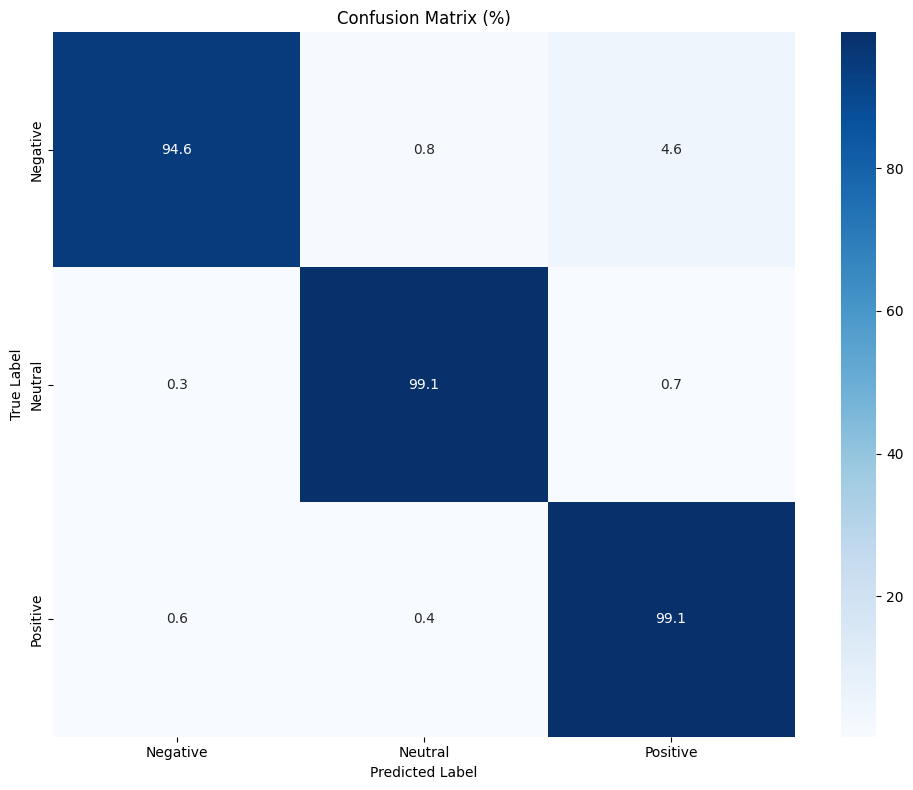

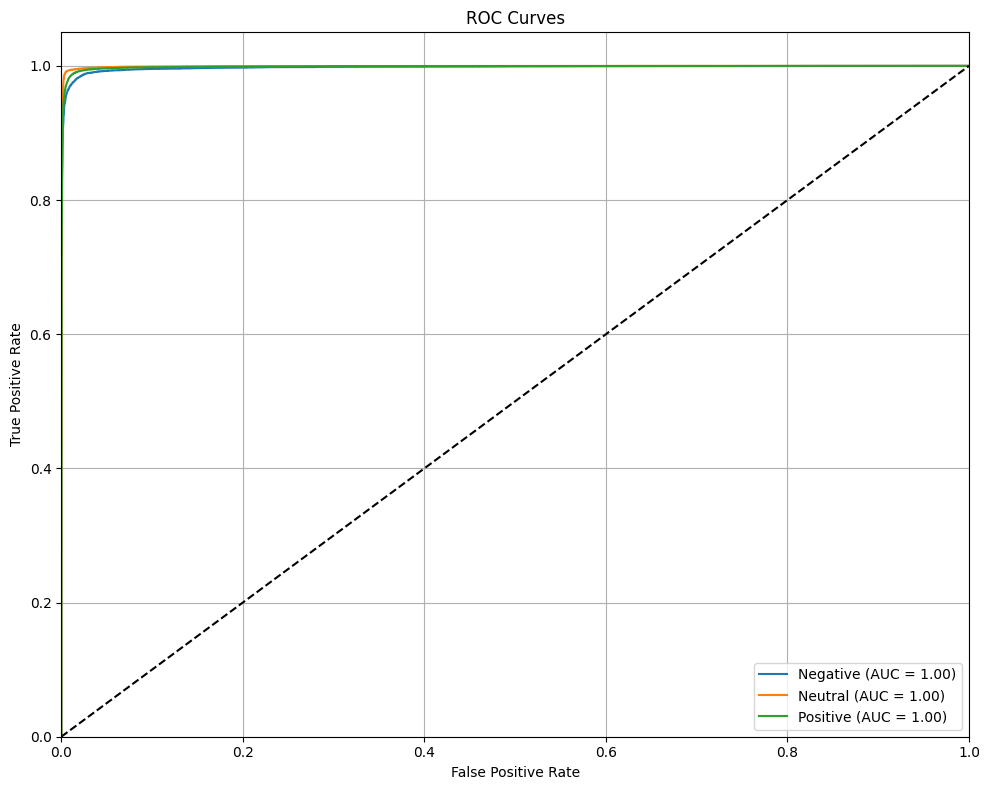

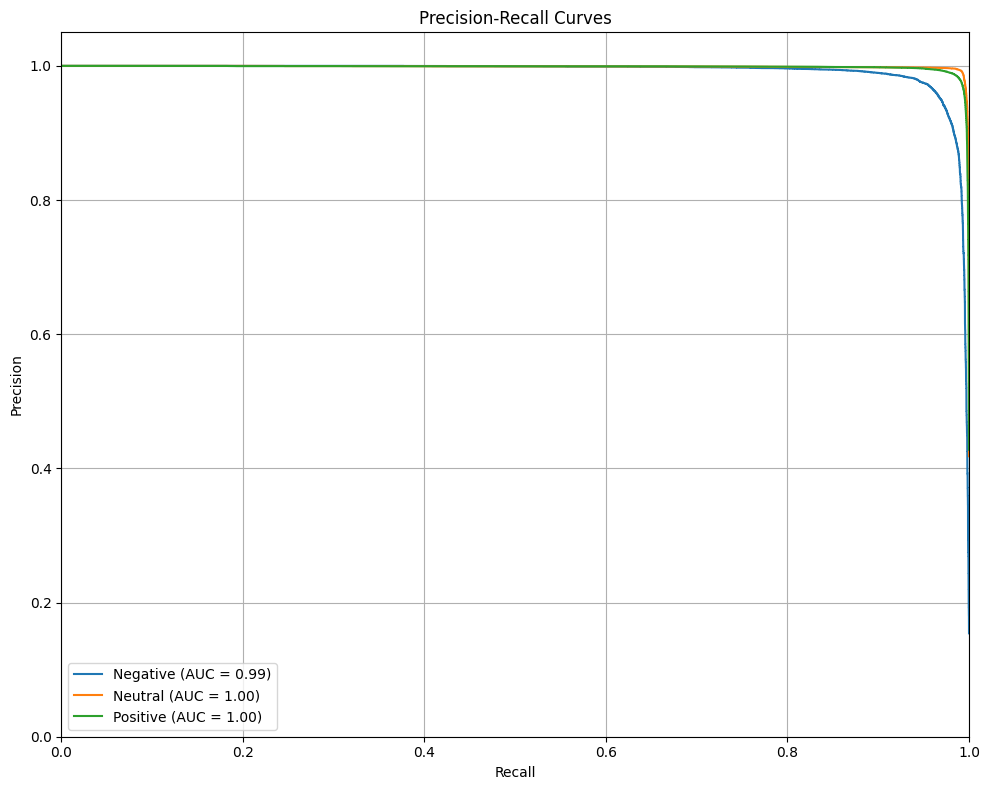


Classification Report:
              precision    recall  f1-score   support

    Negative      0.976     0.946     0.961     21314
     Neutral      0.993     0.991     0.992     57810
    Positive      0.977     0.991     0.984     59156

    accuracy                          0.984    138280
   macro avg      0.982     0.976     0.979    138280
weighted avg      0.984     0.984     0.984    138280



In [ ]:
# Gru Result
evaluate_model_metrics(gru_model, test_loader, label_encoder, device)

In [ ]:
le = LabelEncoder()
sentiments = le.fit_transform(df_cleaned['sentiment'])
X_train, X_test, y_train, y_test = train_test_split(
        df_cleaned['Clean Comments'], sentiments, test_size=0.2, random_state=42, stratify=sentiments
    )

train_dataset = CommentDataset(X_train.values, y_train, vocab)
test_dataset = CommentDataset(X_test.values, y_test, vocab)
train_loader = DataLoader(train_dataset, batch_size=1000, shuffle=True, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=1000, num_workers=4)

Getting model predictions...


Getting predictions: 100%|██████████| 139/139 [00:22<00:00,  6.13it/s]



Generating visualization plots...


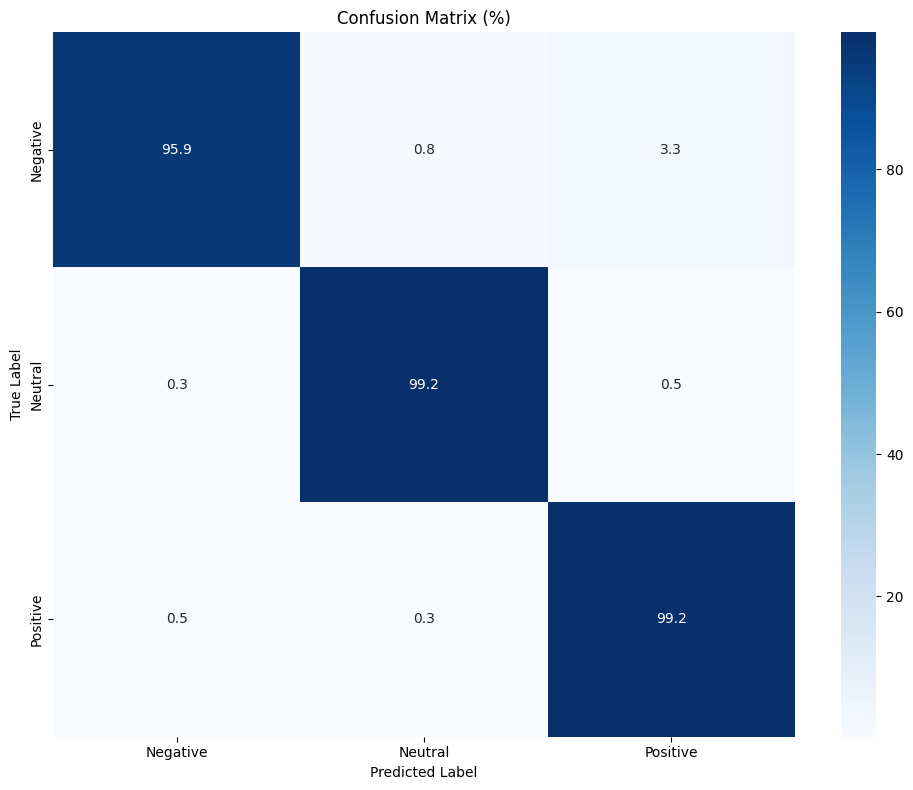

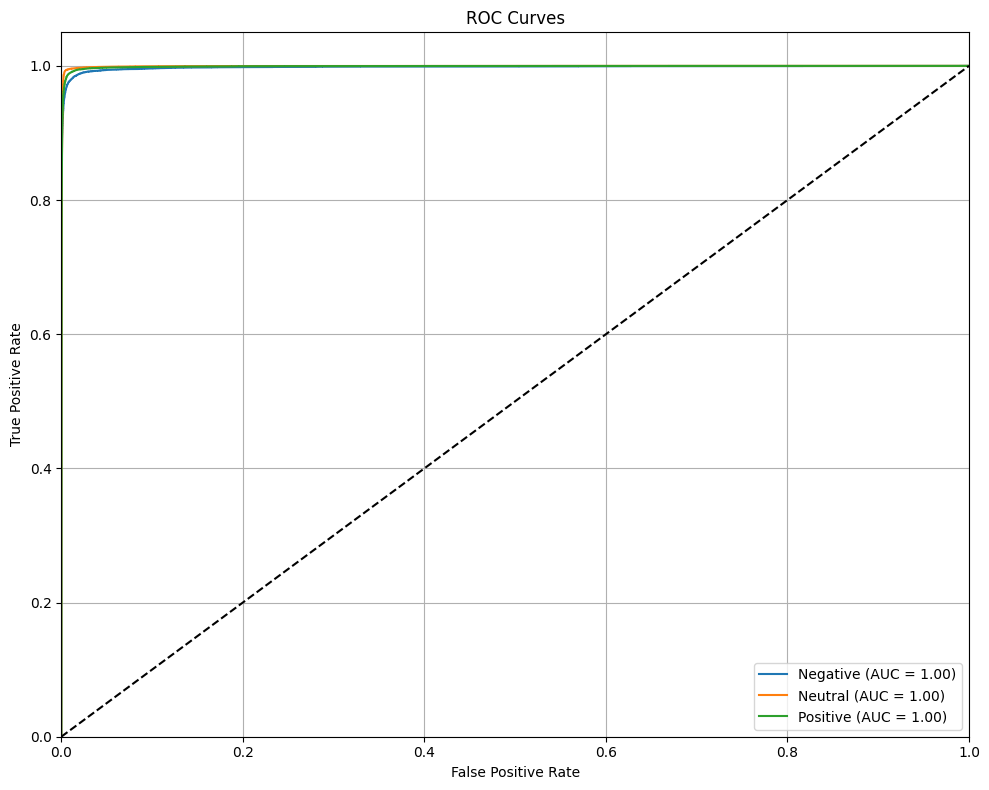

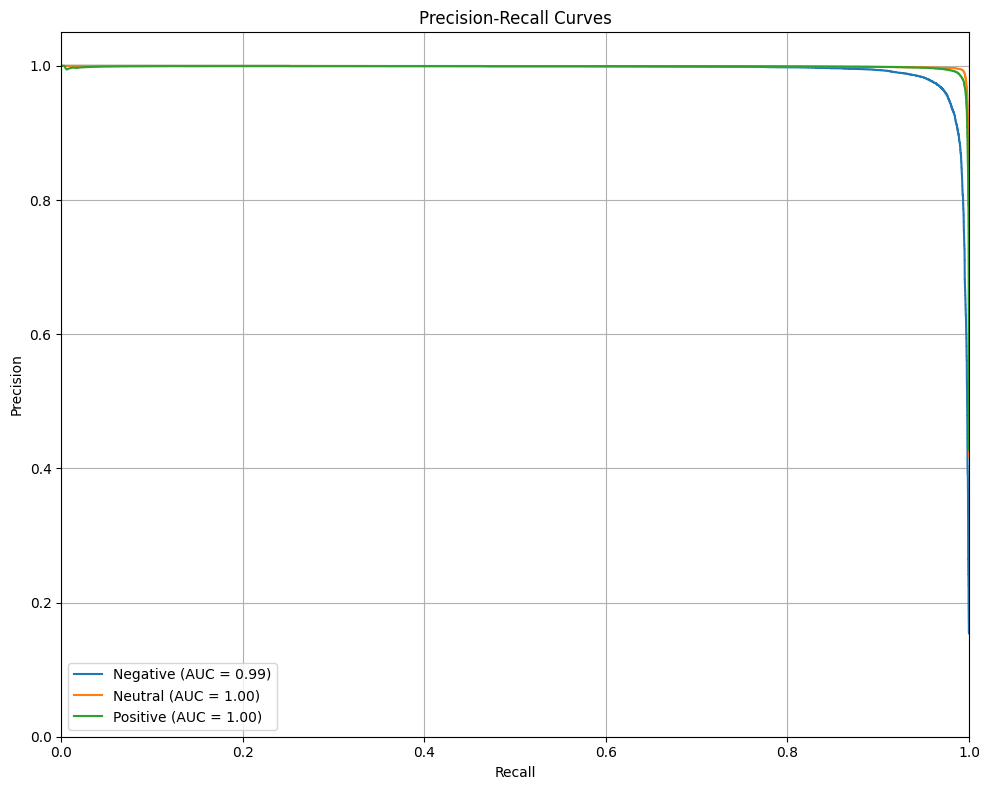


Classification Report:
              precision    recall  f1-score   support

    Negative      0.976     0.959     0.968     21314
     Neutral      0.994     0.992     0.993     57810
    Positive      0.984     0.992     0.988     59156

    accuracy                          0.987    138280
   macro avg      0.985     0.981     0.983    138280
weighted avg      0.987     0.987     0.987    138280



In [ ]:
import torch
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc, precision_recall_curve
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
device = 'cuda' if torch.cuda.is_available() else 'cpu'
def get_predictions(model, data_loader, device):
    """Get model predictions and true labels for the entire dataset."""
    model.eval()
    all_predictions = []
    all_labels = []
    all_probs = []

    with torch.no_grad():
        for comments, labels in tqdm(data_loader, desc="Getting predictions"):
            comments, labels = comments.to(device), labels.to(device)
            outputs = model(comments)
            probs = torch.softmax(outputs, dim=1)
            predictions = torch.argmax(outputs, dim=1)

            all_predictions.extend(predictions.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    return np.array(all_predictions), np.array(all_labels), np.array(all_probs)

def plot_confusion_matrix(y_true, y_pred, labels):
    """Plot confusion matrix with percentages."""
    plt.figure(figsize=(10, 8))
    cm = confusion_matrix(y_true, y_pred)
    cm_percent = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100

    sns.heatmap(cm_percent, annot=True, fmt='.1f', cmap='Blues',
                xticklabels=labels, yticklabels=labels)
    plt.title('Confusion Matrix (%)')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()

def plot_roc_curves(y_true, y_probs, labels):
    """Plot ROC curves for each class."""
    plt.figure(figsize=(10, 8))

    # Convert to one-hot encoding for ROC curve calculation
    y_true_oh = np.eye(len(labels))[y_true]

    for i, label in enumerate(labels):
        fpr, tpr, _ = roc_curve(y_true_oh[:, i], y_probs[:, i])
        roc_auc = auc(fpr, tpr)

        plt.plot(fpr, tpr, label=f'{label} (AUC = {roc_auc:.2f})')

    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curves')
    plt.legend(loc="lower right")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

def plot_prc_curves(y_true, y_probs, labels):
    """Plot Precision-Recall curves for each class."""
    plt.figure(figsize=(10, 8))

    # Convert to one-hot encoding for PR curve calculation
    y_true_oh = np.eye(len(labels))[y_true]

    for i, label in enumerate(labels):
        precision, recall, _ = precision_recall_curve(y_true_oh[:, i], y_probs[:, i])
        pr_auc = auc(recall, precision)

        plt.plot(recall, precision, label=f'{label} (AUC = {pr_auc:.2f})')

    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curves')
    plt.legend(loc="lower left")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

def print_classification_metrics(y_true, y_pred, labels):
    """Print detailed classification report."""
    report = classification_report(y_true, y_pred, target_names=labels, digits=3)
    print("\nClassification Report:")
    print(report)

def evaluate_model_metrics(model, test_loader, label_encoder, device):
    """Comprehensive model evaluation with all metrics and visualizations."""
    # Get predictions
    print("Getting model predictions...")
    y_pred, y_true, y_probs = get_predictions(model, test_loader, device)

    # Get class labels
    labels = label_encoder.classes_

    # Plot all metrics
    print("\nGenerating visualization plots...")
    plot_confusion_matrix(y_true, y_pred, labels)
    plot_roc_curves(y_true, y_probs, labels)
    plot_prc_curves(y_true, y_probs, labels)
    print_classification_metrics(y_true, y_pred, labels)

# Example usage:
evaluate_model_metrics(model, test_loader, label_encoder, device)

Getting model predictions...


Getting predictions: 100%|██████████| 139/139 [00:09<00:00, 15.37it/s]



Generating visualization plots...


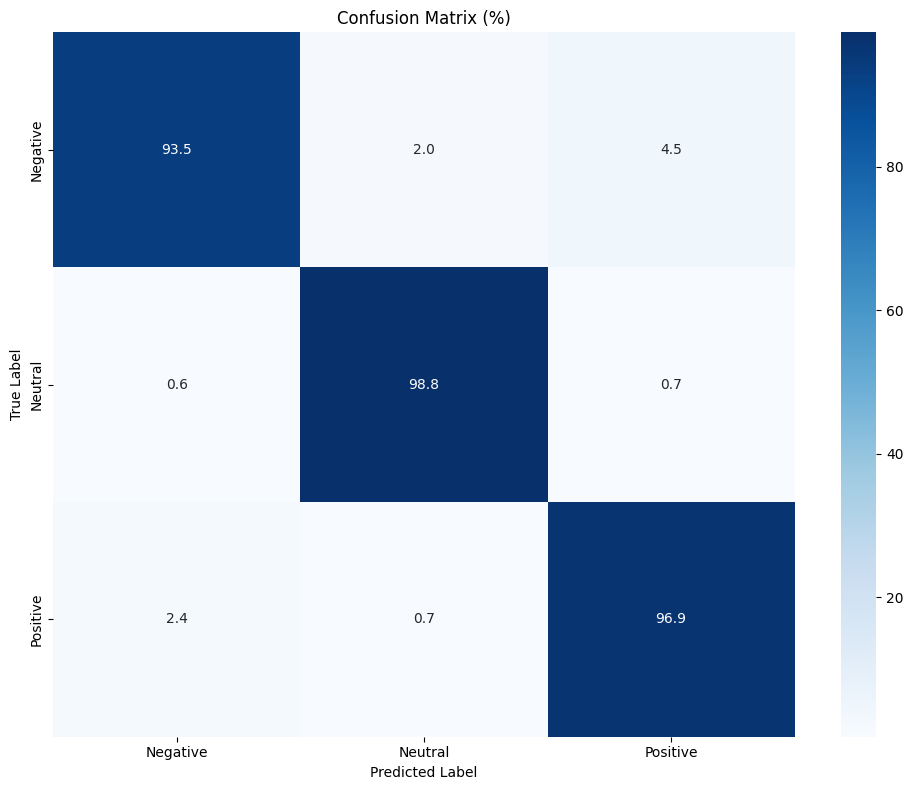

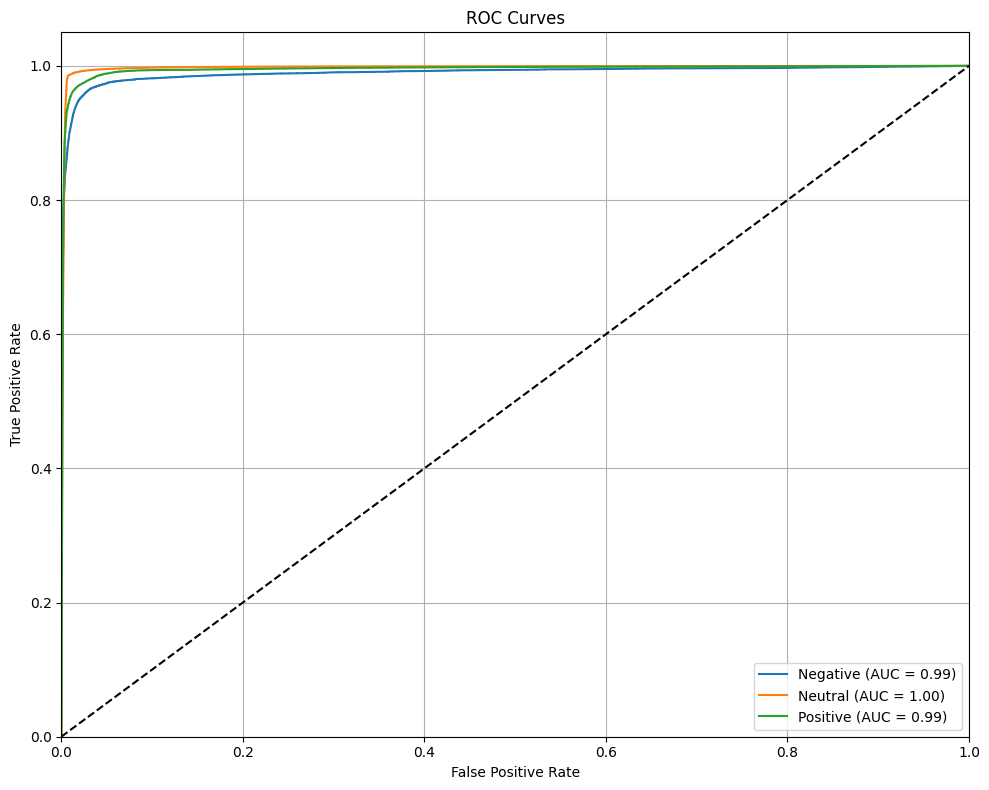

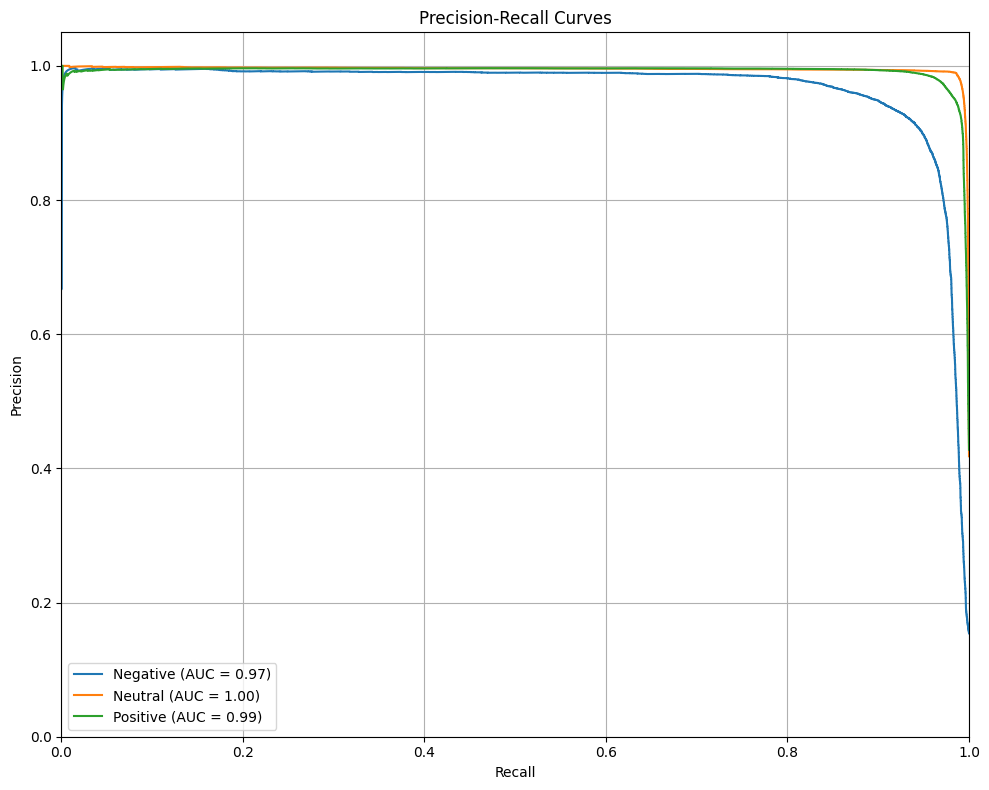


Classification Report:
              precision    recall  f1-score   support

    Negative      0.919     0.935     0.927     21314
     Neutral      0.985     0.988     0.986     57810
    Positive      0.977     0.969     0.973     59156

    accuracy                          0.971    138280
   macro avg      0.960     0.964     0.962    138280
weighted avg      0.971     0.971     0.971    138280



In [ ]:
# rnn model results
evaluate_model_metrics(rnn_model, test_loader, label_encoder, device)

In [ ]:
import joblib
torch.save(model.state_dict(), 'best_model.pt')

# Save vocabulary and label encoder
joblib.dump(vocab, 'vocab.pkl')
joblib.dump(label_encoder, 'label_encoder.pkl')

print("Model files saved successfully!")

Model files saved successfully!


In [ ]:
class SentimentPredictor:
    def __init__(self, model_path='/kaggle/working/best_model.pt',
                 vocab_path='/kaggle/working/vocab.pkl',
                 label_encoder_path='/kaggle/working/label_encoder.pkl',
                 max_length=100):
        self.device = 'cuda' if torch.cuda.is_available() else 'cpu'
        self.max_length = max_length

        # Load vocabulary and label encoder
        self.vocab = joblib.load(vocab_path)
        self.label_encoder = joblib.load(label_encoder_path)

        # Initialize model with the same parameters as during training
        self.model = SentimentRNN(
            vocab_size=len(self.vocab.itos),
            embedding_dim=300,  # Changed from 100 to 300 to match training
            hidden_dim=256,
            output_dim=len(self.label_encoder.classes_),
            n_layers=2,
            dropout=0.5,
            bidirectional=True  # Added to match training configuration
        ).to(self.device)

        # Load trained weights with safety flag
        self.model.load_state_dict(
            torch.load(model_path, map_location=self.device, weights_only=True)
        )
        self.model.eval()

    def predict(self, comment):
        # Preprocess comment
        numericalized_comment = self.vocab.numericalize(comment)

        # Pad or truncate
        if len(numericalized_comment) < self.max_length:
            numericalized_comment.extend([0] * (self.max_length - len(numericalized_comment)))
        else:
            numericalized_comment = numericalized_comment[:self.max_length]

        # Convert to tensor
        comment_tensor = torch.tensor(numericalized_comment).unsqueeze(0).to(self.device)

        # Get prediction
        with torch.no_grad():
            prediction = self.model(comment_tensor)
            predicted_class = self.label_encoder.inverse_transform([prediction.argmax(1).item()])[0]
            probabilities = torch.softmax(prediction, dim=1)
            confidence = probabilities.max().item() * 100

        return {
            'sentiment': predicted_class,
            'confidence': f"{confidence:.2f}%",
            'probabilities': {
                label: f"{prob:.2f}%"
                for label, prob in zip(self.label_encoder.classes_, probabilities[0].cpu().numpy() * 100)
            }
        }

def run_sentiment_analyzer():
    print("Loading sentiment analyzer...")

    try:
        predictor = SentimentPredictor()
        print("\nSentiment Analyzer is ready!")
        print("\nEnter a comment to analyze (type 'quit' to exit)")

        while True:
            comment = input("\nEnter comment: ")

            if comment.lower() == 'quit':
                print("Thank you for using the Sentiment Analyzer!")
                break

            if comment.strip() == "":
                print("Please enter a valid comment!")
                continue

            result = predictor.predict(comment)
            print(f"\nSentiment: {result['sentiment']}")
            print(f"Confidence: {result['confidence']}")
            print("\nProbabilities for each class:")
            for sentiment, prob in result['probabilities'].items():
                print(f"{sentiment}: {prob}")

    except FileNotFoundError:
        print("Error: Model files not found. Please make sure you have trained the model first.")
        print("Expected files:")
        print("- best_model.pt")
        print("- vocab.pkl")
        print("- label_encoder.pkl")
    except Exception as e:
        print(f"An error occurred: {str(e)}")

if __name__ == "__main__":
    run_sentiment_analyzer()

Loading sentiment analyzer...

Sentiment Analyzer is ready!

Enter a comment to analyze (type 'quit' to exit)



Enter comment:  quit


Thank you for using the Sentiment Analyzer!
